## Import Libraries

In [1]:
!pip install ydata_profiling

Defaulting to user installation because normal site-packages is not writeable


In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from ydata_profiling import ProfileReport

from sklearn.preprocessing import OneHotEncoder, StandardScaler

import pandas as pd
import numpy as np
%matplotlib inline


## Read Car_Sales.csv Data

In [3]:
data = pd.read_csv("Car_sales - Car_sales.csv")


### Shape of Data

In [4]:
data.shape

(157, 16)

## Let's Explore the data

In [5]:
data.head()

,Manufacturer,Model,Sales_in_thousands,__year_resale_value,Vehicle_type,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Latest_Launch,Power_perf_factor
0,Acura,Integra,16.919,16.360,Passenger,21.50,1.8,140.0,101.2,67.3,172.4,2.639,13.2,28.0,2/2/2012,58.280150
1,Acura,TL,39.384,19.875,Passenger,28.40,3.2,225.0,108.1,70.3,192.9,3.517,17.2,25.0,6/3/2011,91.370778
2,Acura,CL,14.114,18.225,Passenger,NaN,3.2,225.0,106.9,70.6,192.0,3.470,17.2,26.0,1/4/2012,NaN
3,Acura,RL,8.588,29.725,Passenger,42.00,3.5,210.0,114.6,71.4,196.6,3.850,18.0,22.0,3/10/2011,91.389779
4,Audi,A4,20.397,22.255,Passenger,23.99,1.8,150.0,102.6,68.2,178.0,2.998,16.4,27.0,10/8/2011,62.777639


### Basic information about the dataset and data types

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157 entries, 0 to 156
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Manufacturer         157 non-null    object 
 1   Model                157 non-null    object 
 2   Sales_in_thousands   157 non-null    float64
 3   __year_resale_value  121 non-null    float64
 4   Vehicle_type         157 non-null    object 
 5   Price_in_thousands   155 non-null    float64
 6   Engine_size          156 non-null    float64
 7   Horsepower           156 non-null    float64
 8   Wheelbase            156 non-null    float64
 9   Width                156 non-null    float64
 10  Length               156 non-null    float64
 11  Curb_weight          155 non-null    float64
 12  Fuel_capacity        156 non-null    float64
 13  Fuel_efficiency      154 non-null    float64
 14  Latest_Launch        157 non-null    object 
 15  Power_perf_factor    155 non-null    flo

In [7]:
data.columns

Index(['Manufacturer', 'Model', 'Sales_in_thousands', '__year_resale_value',
       'Vehicle_type', 'Price_in_thousands', 'Engine_size', 'Horsepower',
       'Wheelbase', 'Width', 'Length', 'Curb_weight', 'Fuel_capacity',
       'Fuel_efficiency', 'Latest_Launch', 'Power_perf_factor'],
      dtype='object')

Prior to summary statistics, identify missing values or duplicates and drop them.

### Missing values

In [8]:
# Generate the profile report
report = ProfileReport(data)

# Save the report to a file
report.to_file("data_profile_report.html")

# Alternatively, you can also display the report directly
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
data.isna().sum()

Manufacturer            0
Model                   0
Sales_in_thousands      0
__year_resale_value    36
Vehicle_type            0
Price_in_thousands      2
Engine_size             1
Horsepower              1
Wheelbase               1
Width                   1
Length                  1
Curb_weight             2
Fuel_capacity           1
Fuel_efficiency         3
Latest_Launch           0
Power_perf_factor       2
dtype: int64

## Check Duplicates

In [10]:
data.duplicated().sum()

0

In [12]:
data=data.drop_duplicates()

### Keep only numeric columns in a dataframe

hint: (use function select_dtype)

In [14]:
# Select numeric columns
data = data.select_dtypes(include='number')

In [15]:
data.shape

(157, 12)

In [17]:
data= data.fillna(data.mean())

In [18]:
data.isna().sum()

Sales_in_thousands     0
__year_resale_value    0
Price_in_thousands     0
Engine_size            0
Horsepower             0
Wheelbase              0
Width                  0
Length                 0
Curb_weight            0
Fuel_capacity          0
Fuel_efficiency        0
Power_perf_factor      0
dtype: int64

### Summary statistics

In [19]:
data.describe()

,Sales_in_thousands,__year_resale_value,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor
count,157.000000,157.000000,157.000000,157.000000,157.000000,157.000000,157.00000,157.000000,157.000000,157.000000,157.000000,157.000000
mean,52.998076,18.072975,27.390755,3.060897,185.948718,107.487179,71.15000,187.343590,3.378026,17.951923,23.844156,77.043591
std,68.029422,10.045282,14.259359,1.041299,56.518297,7.616772,3.44079,13.388635,0.626447,3.875440,4.241326,24.980973
min,0.110000,5.160000,9.235000,1.000000,55.000000,92.600000,62.60000,149.400000,1.895000,10.300000,15.000000,23.276272
25%,14.114000,12.545000,18.145000,2.300000,150.000000,103.000000,68.40000,177.600000,2.975000,15.800000,21.000000,60.727447
50%,29.450000,17.710000,23.400000,3.000000,180.000000,107.000000,70.60000,187.800000,3.368000,17.200000,24.000000,72.290355
75%,67.956000,18.140000,31.930000,3.500000,215.000000,112.200000,73.40000,196.100000,3.778000,19.500000,26.000000,89.401935
max,540.561000,67.550000,85.500000,8.000000,450.000000,138.700000,79.90000,224.500000,5.572000,32.000000,45.000000,188.144323


## Distribution

In [22]:
from scipy import stats
from scipy.stats import zscore

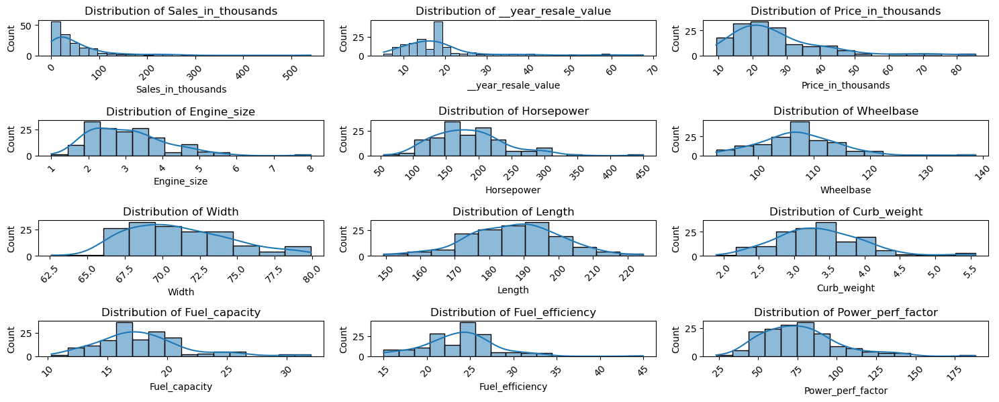

In [20]:
plt.figure(figsize=(15, 10))

# Iterate through each channel and plot on a separate subplot
for i, column in enumerate(data.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## Normalized Distribution (Gaussian)

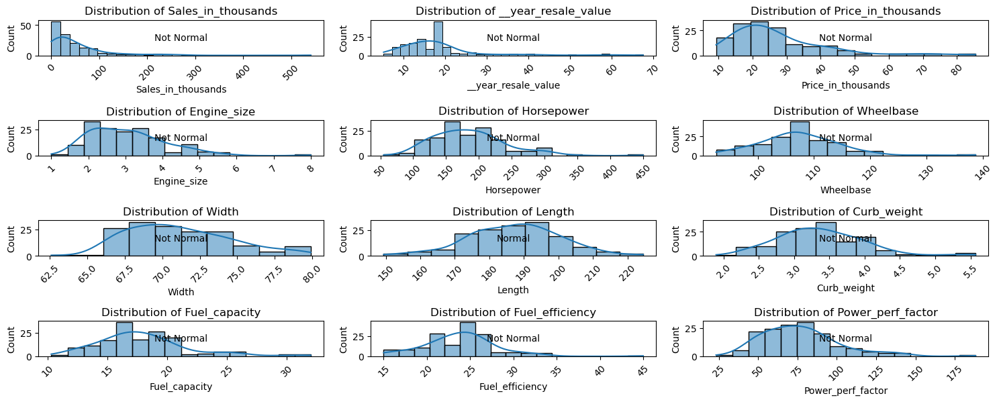

In [23]:
plt.figure(figsize=(15, 10))

# Iterate through each column and plot on a separate subplot
for i, column in enumerate(data.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

    # Add additional analysis to detect distribution type
    # Check for normal distribution
    k2, p = stats.normaltest(data[column])
    if p < 0.05:
        plt.text(0.5, 0.5, "Not Normal", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
    else:
        plt.text(0.5, 0.5, "Normal", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## Skewed Distribution (negative and positive)


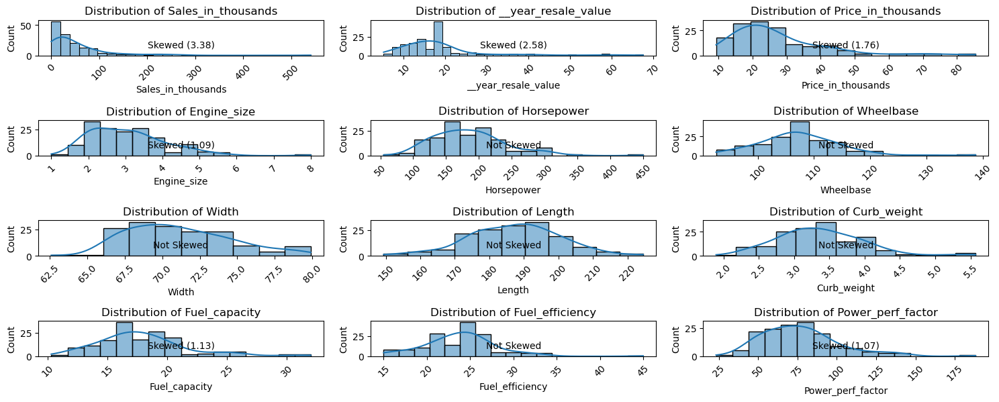

In [24]:
plt.figure(figsize=(15, 10))

# Iterate through each column and plot on a separate subplot
for i, column in enumerate(data.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

    # Check for skewness
    skewness = stats.skew(data[column])
    if skewness < -1 or skewness > 1:
        plt.text(0.5, 0.3, f"Skewed ({skewness:.2f})", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
    else:
        plt.text(0.5, 0.3, f"Not Skewed", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

Sales_in_thousands seems to be the only column with skewness (+ively skewed)

## Outliers

Plot Boxplot

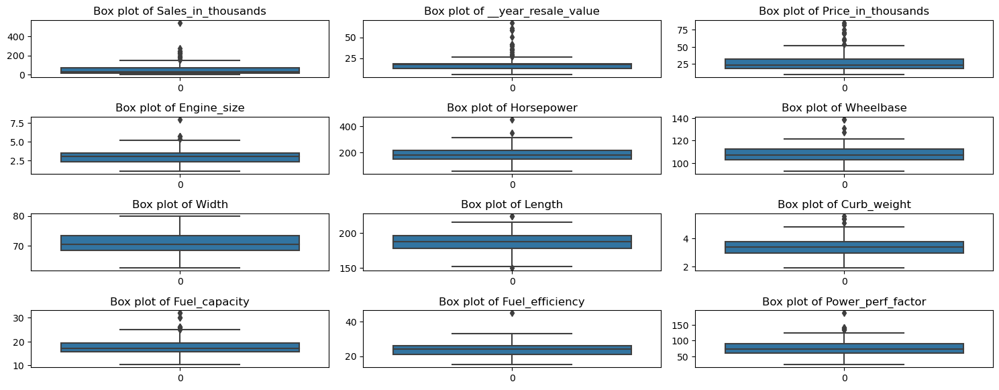

In [25]:
plt.figure(figsize=(15, 10))

# Iterate through each column and plot on a separate subplot
for i, column in enumerate(data.columns):
    plt.subplot(7, 3, i+1)
    sns.boxplot(data[column])
    plt.title(f'Box plot of {column}')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## Z-score

Detect Outliers using Z-Score. (Set threshold =3)

In [27]:
# Function to detect outliers using Z-score for a specific column
def detect_outliers_z_score(data, threshold=3):
    z_scores = (data - data.mean()) / data.std()
    outliers = (np.abs(z_scores) > threshold).any(axis=1)
    return outliers

In [28]:
# Detect outliers for each numeric column
outliers = detect_outliers_z_score(data[data.columns])

# Print indices of rows containing outliers
outlier_indices = data.index[outliers].tolist()
print("Index of rows with outliers:", outlier_indices)
print("Count of outliers:", len(outlier_indices))

Index of rows with outliers: [18, 26, 39, 40, 41, 42, 43, 52, 56, 74, 78, 94, 95, 99, 125, 126]
Count of outliers: 16


In [29]:
data.head()

,Sales_in_thousands,__year_resale_value,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor
0,16.919,16.360,21.500000,1.8,140.0,101.2,67.3,172.4,2.639,13.2,28.0,58.280150
1,39.384,19.875,28.400000,3.2,225.0,108.1,70.3,192.9,3.517,17.2,25.0,91.370778
2,14.114,18.225,27.390755,3.2,225.0,106.9,70.6,192.0,3.470,17.2,26.0,77.043591
3,8.588,29.725,42.000000,3.5,210.0,114.6,71.4,196.6,3.850,18.0,22.0,91.389779
4,20.397,22.255,23.990000,1.8,150.0,102.6,68.2,178.0,2.998,16.4,27.0,62.777639


## Remove outliers

In [30]:
# Remove outliers based on Z-score for a specific column
def remove_outliers_z_score_column(data_column, threshold=3):
    z_scores = zscore(data_column)
    filtered_data = data_column[np.abs(z_scores) <= threshold]
    return filtered_data

In [31]:
updated_data = remove_outliers_z_score_column(data)

In [32]:
updated_data.head(15)

,Sales_in_thousands,__year_resale_value,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor
0,16.919,16.360000,21.500000,1.8,140.0,101.2,67.3,172.4,2.639,13.2,28.0,58.280150
1,39.384,19.875000,28.400000,3.2,225.0,108.1,70.3,192.9,3.517,17.2,25.0,91.370778
2,14.114,18.225000,27.390755,3.2,225.0,106.9,70.6,192.0,3.470,17.2,26.0,77.043591
3,8.588,29.725000,42.000000,3.5,210.0,114.6,71.4,196.6,3.850,18.0,22.0,91.389779
4,20.397,22.255000,23.990000,1.8,150.0,102.6,68.2,178.0,2.998,16.4,27.0,62.777639
5,18.780,23.555000,33.950000,2.8,200.0,108.7,76.1,192.0,3.561,18.5,22.0,84.565105
6,1.380,39.000000,62.000000,4.2,310.0,113.0,74.0,198.2,3.902,23.7,21.0,134.656858
7,19.747,18.072975,26.990000,2.5,170.0,107.3,68.4,176.0,3.179,16.6,26.0,71.191207
8,9.231,28.675000,33.400000,2.8,193.0,107.3,68.5,176.0,3.197,16.6,24.0,81.877069
9,17.527,36.125000,38.900000,2.8,193.0,111.4,70.9,188.0,3.472,18.5,25.0,83.998724


In [33]:
# Detect outliers for each numeric column
outliers = detect_outliers_z_score(updated_data[updated_data.columns])

# Print indices of rows containing outliers
outlier_indices = updated_data.index[outliers].tolist()
print("Index of rows with outliers:", outlier_indices)
print("Count of outliers:", len(outlier_indices))

Index of rows with outliers: [6, 24, 39, 40, 42, 49, 55, 58, 73, 93, 94, 124, 137, 144]
Count of outliers: 14


## Distribution Check

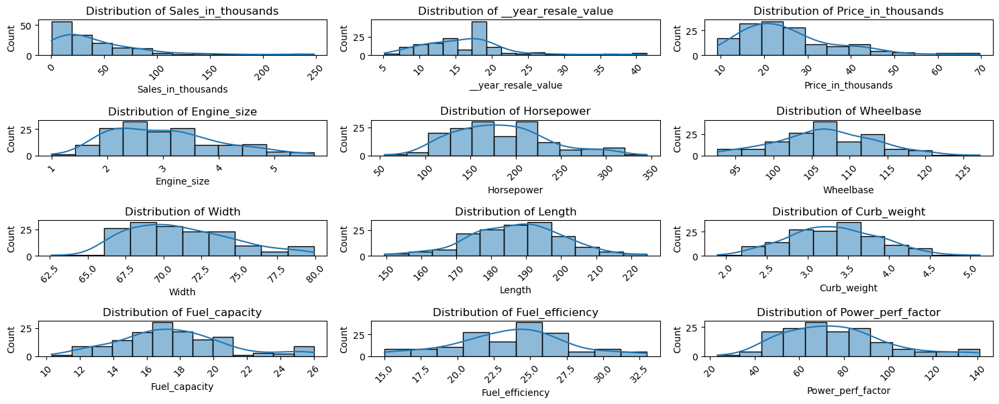

In [34]:
plt.figure(figsize=(15, 10))

# Iterate through each channel and plot on a separate subplot
for i, column in enumerate(updated_data.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(updated_data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

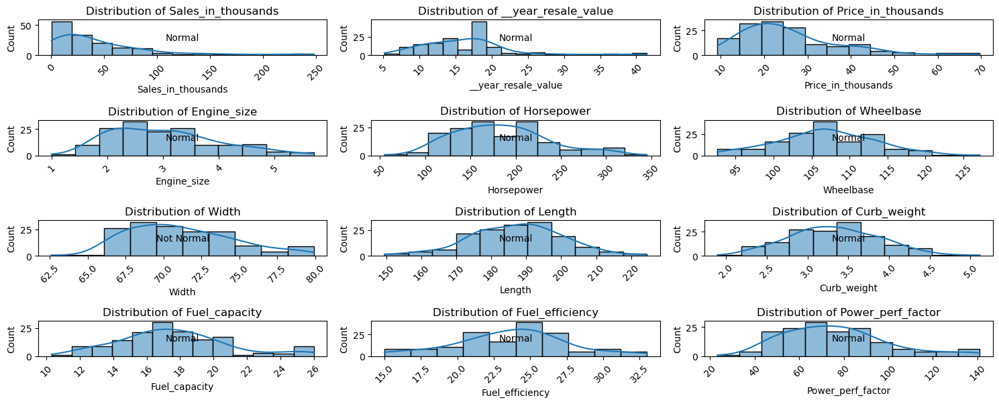

In [35]:
plt.figure(figsize=(15, 10))

# Iterate through each column and plot on a separate subplot
for i, column in enumerate(updated_data.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(updated_data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

    # Add additional analysis to detect distribution type
    # Check for normal distribution
    k2, p = stats.normaltest(updated_data[column])
    if p < 0.05:
        plt.text(0.5, 0.5, "Not Normal", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
    else:
        plt.text(0.5, 0.5, "Normal", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

#### Use binning technique to remove Skewness

In [36]:
# Calculate skewness
skewness = updated_data['Sales_in_thousands'].skew()
print("Skewness:", skewness)

Skewness: 1.9608492073723116


In [37]:
num_bins = 50

# Apply binning to Feature 3 and Feature 4
updated_data['Sales_in_thousands_binned'] = pd.qcut(updated_data['Sales_in_thousands'], q=num_bins, labels=False)

In [38]:
# Display the first few rows of the dataset with binned features
updated_data.head()

,Sales_in_thousands,__year_resale_value,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor,Sales_in_thousands_binned
0,16.919,16.360,21.500000,1.8,140.0,101.2,67.3,172.4,2.639,13.2,28.0,58.280150,15.0
1,39.384,19.875,28.400000,3.2,225.0,108.1,70.3,192.9,3.517,17.2,25.0,91.370778,30.0
2,14.114,18.225,27.390755,3.2,225.0,106.9,70.6,192.0,3.470,17.2,26.0,77.043591,12.0
3,8.588,29.725,42.000000,3.5,210.0,114.6,71.4,196.6,3.850,18.0,22.0,91.389779,7.0
4,20.397,22.255,23.990000,1.8,150.0,102.6,68.2,178.0,2.998,16.4,27.0,62.777639,19.0


In [98]:
# ## Step 2: Choose Bin Width (Example: 10 bins)
# bin_width = 10

# # Step 3: Create Bins
# bins = pd.cut(updated_data['Sales_in_thousands'], bins=bin_width)

# # Step 4: Replace Values
# updated_data['Sales_in_thousands_binned'] = bins.astype(str)

# # Print the DataFrame with binned column
# print(updated_data[['Sales_in_thousands', 'Sales_in_thousands_binned']])

In [39]:
updated_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157 entries, 0 to 156
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Sales_in_thousands         155 non-null    float64
 1   __year_resale_value        152 non-null    float64
 2   Price_in_thousands         153 non-null    float64
 3   Engine_size                156 non-null    float64
 4   Horsepower                 156 non-null    float64
 5   Wheelbase                  154 non-null    float64
 6   Width                      157 non-null    float64
 7   Length                     157 non-null    float64
 8   Curb_weight                154 non-null    float64
 9   Fuel_capacity              153 non-null    float64
 10  Fuel_efficiency            156 non-null    float64
 11  Power_perf_factor          156 non-null    float64
 12  Sales_in_thousands_binned  155 non-null    float64
dtypes: float64(13)
memory usage: 16.1 KB


In [40]:
updated_data.drop(['Sales_in_thousands'],axis=1,inplace=True)

In [41]:
updated_data.rename(columns={"Sales_in_thousands_binned": "Sales_in_thousands"},inplace=True)

## Distribution check
To confirm if skewness is removed or not

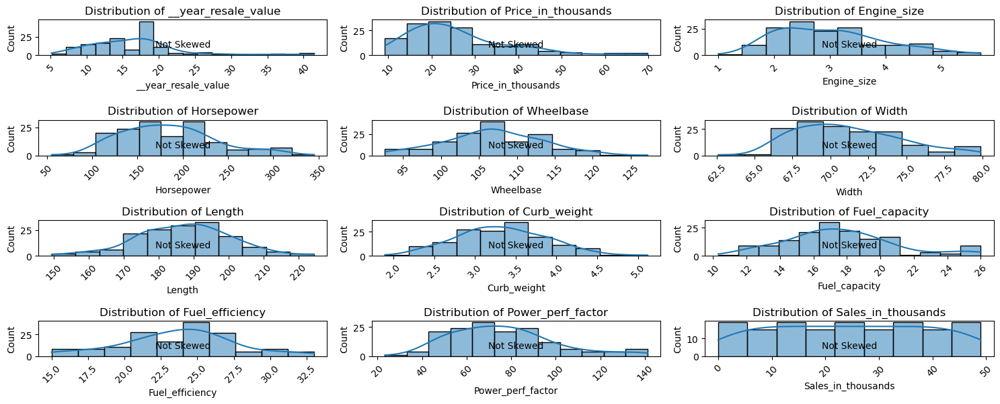

In [42]:
plt.figure(figsize=(15, 10))

# Iterate through each column and plot on a separate subplot
for i, column in enumerate(updated_data.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(updated_data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

    # Check for skewness
    skewness = stats.skew(updated_data[column])
    if skewness < -1 or skewness > 1:
        plt.text(0.5, 0.3, f"Skewed ({skewness:.2f})", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
    else:
        plt.text(0.5, 0.3, f"Not Skewed", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

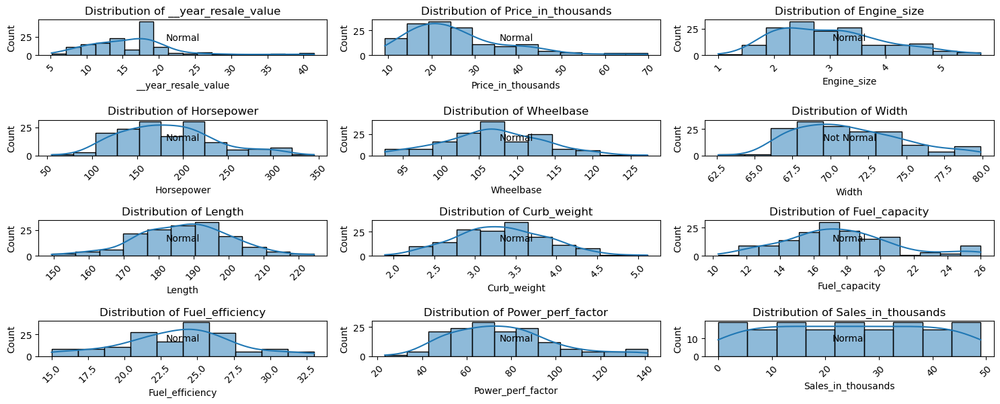

In [103]:
plt.figure(figsize=(15, 10))

# Iterate through each column and plot on a separate subplot
for i, column in enumerate(updated_data.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(updated_data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

    # Add additional analysis to detect distribution type
    # Check for normal distribution
    k2, p = stats.normaltest(updated_data[column])
    if p < 0.05:
        plt.text(0.5, 0.5, "Not Normal", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)
    else:
        plt.text(0.5, 0.5, "Normal", horizontalalignment='center', verticalalignment='center', transform=plt.gca().transAxes)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

### Standardization and Normalization

Apply standardization and normalization on the columns

Standardization and normalization are two common techniques used in data preprocessing, particularly when working with machine learning models. These techniques ensure that data is on a comparable scale, which can be crucial for algorithms that are sensitive to the scale of input data, such as gradient descent-based models or distance-based models like K-nearest neighbors.

## 1. Standardization

Standardization transforms the data to have a mean of 0 and a standard deviation of 1. This method is particularly useful when the data follows a Gaussian distribution.

#### The formula for standardization is:
* z=(x−μ)/σ


#### Where:

* xx is an original data point.
* μ is the mean of the data.
* σ is the standard deviation of the data.
* z is the standardized value.

## 2. Normalization

Normalization, also known as min-max scaling, rescales the data to a fixed range, usually [0, 1]. This is especially useful when you know that the data does not follow a Gaussian distribution or when the model requires a bounded input, such as neural networks with sigmoid activation functions.

#### The formula for normalization is:
* x′=(x−min(x))(max(x)−min(x))

#### Where:

* x is the original data point.
* min(x)min(x) and max(x)max(x) are the minimum and maximum values of the feature, respectively.
* x′ is the normalized value

## Why We Do This ?
- **Improved Performance**
- **Faster Convergence**
- **Unit Consistency**
- **Distance-Based Models**
- **Better Interpretability**

In [43]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [44]:
updated_data.head()

,__year_resale_value,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor,Sales_in_thousands
0,16.360,21.500000,1.8,140.0,101.2,67.3,172.4,2.639,13.2,28.0,58.280150,15.0
1,19.875,28.400000,3.2,225.0,108.1,70.3,192.9,3.517,17.2,25.0,91.370778,30.0
2,18.225,27.390755,3.2,225.0,106.9,70.6,192.0,3.470,17.2,26.0,77.043591,12.0
3,29.725,42.000000,3.5,210.0,114.6,71.4,196.6,3.850,18.0,22.0,91.389779,7.0
4,22.255,23.990000,1.8,150.0,102.6,68.2,178.0,2.998,16.4,27.0,62.777639,19.0


In [45]:
updated_data.columns

Index(['__year_resale_value', 'Price_in_thousands', 'Engine_size',
       'Horsepower', 'Wheelbase', 'Width', 'Length', 'Curb_weight',
       'Fuel_capacity', 'Fuel_efficiency', 'Power_perf_factor',
       'Sales_in_thousands'],
      dtype='object')

From the distribution check, we find out that after removing skewness, all the data has Gaussian distribution, so standardization is uusally applied to such data. But for analysis, we would standardize the dataset and then normalized the orignal dataset.

In [46]:
# Columns to be standardized and normalized
columns_to_process = ['__year_resale_value', 'Price_in_thousands', 'Engine_size',
       'Horsepower', 'Wheelbase', 'Width', 'Length', 'Curb_weight',
       'Fuel_capacity', 'Fuel_efficiency', 'Power_perf_factor',
       'Sales_in_thousands']

## Standardization

In [48]:
# Standardization (Range: +1 to -1 with std=1, mean=0)
scaler_standardization = StandardScaler()

In [49]:
df_standardized = updated_data.copy()  # Create a copy of the original DataFrame

In [50]:
df_standardized[columns_to_process] = scaler_standardization.fit_transform(updated_data[columns_to_process])

In [111]:
print("Standardized DataFrame:")
df_standardized.head()

Standardized DataFrame:


,__year_resale_value,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor,Sales_in_thousands
0,-0.053866,-0.390070,-1.276771,-0.844774,-0.881115,-1.122510,-1.119712,-1.251224,-1.347163,1.104323,-0.773644,-0.653328
1,0.468290,0.200948,0.177367,0.777733,0.179833,-0.247827,0.416338,0.321406,-0.125467,0.332332,0.644560,0.378593
2,0.223181,0.114501,0.177367,0.777733,-0.004680,-0.160359,0.348901,0.237222,-0.125467,0.589662,0.030523,-0.859712
3,1.931516,1.365854,0.488968,0.491408,1.179276,0.072890,0.693576,0.917859,0.118872,-0.439660,0.645375,-1.203686
4,0.821841,-0.176790,-1.276771,-0.653891,-0.665850,-0.860105,-0.700108,-0.608201,-0.369806,0.846992,-0.580890,-0.378149


## Normalization

In [51]:
# Normalization (Range: 0-1)
scaler_normalization = MinMaxScaler()
df_normalized = updated_data.copy()  # Create a copy of the original DataFrame
df_normalized[columns_to_process] = scaler_normalization.fit_transform(updated_data[columns_to_process])

In [52]:
print("Normalized DataFrame:")
df_normalized.head()

Normalized DataFrame:


,__year_resale_value,Price_in_thousands,Engine_size,Horsepower,Wheelbase,Width,Length,Curb_weight,Fuel_capacity,Fuel_efficiency,Power_perf_factor,Sales_in_thousands
0,0.308625,0.202761,0.170213,0.293103,0.248555,0.271676,0.306258,0.231056,0.184713,0.722222,0.296983,0.306122
1,0.405484,0.316829,0.468085,0.586207,0.447977,0.445087,0.579228,0.503727,0.439490,0.555556,0.577734,0.612245
2,0.360017,0.300145,0.468085,0.586207,0.413295,0.462428,0.567244,0.489130,0.439490,0.611111,0.456178,0.244898
3,0.676908,0.541660,0.531915,0.534483,0.635838,0.508671,0.628495,0.607143,0.490446,0.388889,0.577895,0.142857
4,0.471066,0.243925,0.170213,0.327586,0.289017,0.323699,0.380826,0.342547,0.388535,0.666667,0.335141,0.387755


## Distribution check

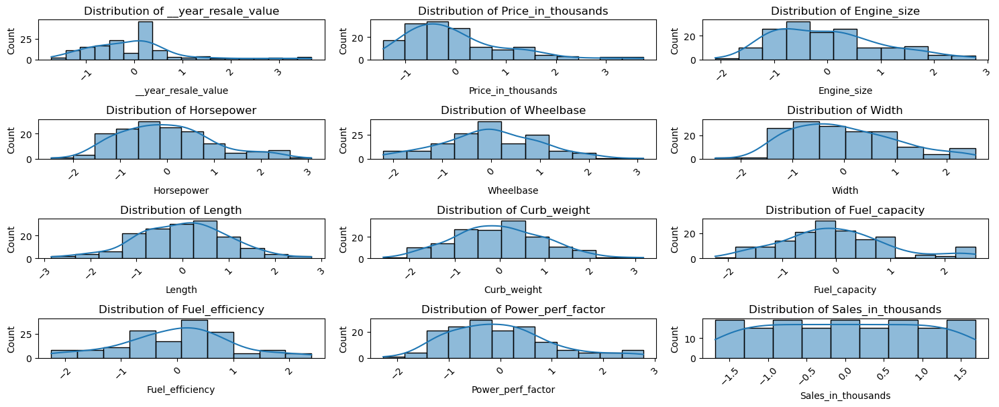

In [53]:
plt.figure(figsize=(15, 10))

# Iterate through each channel and plot on a separate subplot
for i, column in enumerate(df_standardized.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(df_standardized[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

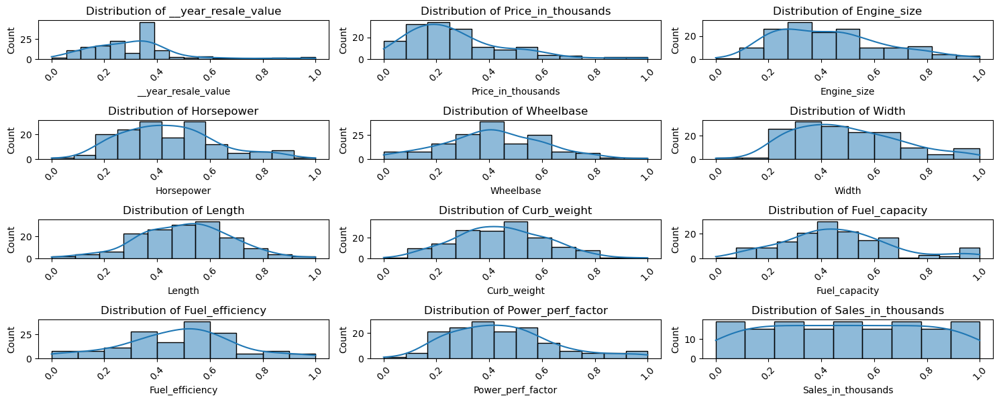

In [54]:
plt.figure(figsize=(15, 10))

# Iterate through each channel and plot on a separate subplot
for i, column in enumerate(df_normalized.columns):
    plt.subplot(7, 3, i+1)
    sns.histplot(df_normalized[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## The END!